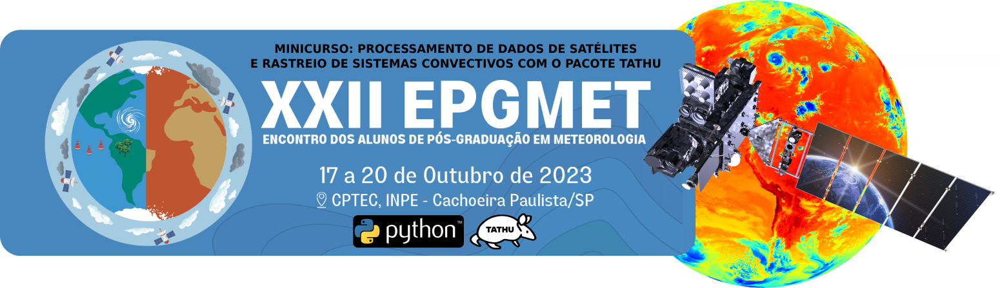

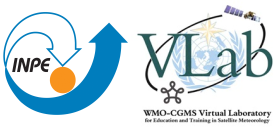

**Desenvolvido por:** Diego Souza - INPE / CGCT / DISSM (diego.souza@inpe.br / https://github.com/diegormsouza)

**Versão do Notebook COLAB:** 16 de outubro de 2023

# **Introdução**

Bem vindos ao notebook **"Processamento de Dados de Satélites com Python"**! (versão curta)

---

Este "notebook" interativo contém instruções para a instalação das ferramentas necessárias para a criação de scripts Python para a manipulação dos dados mostrados no curso. Todas as instruções e scripts são executados na nuvem, não sendo necessário instalar as ferramentas e baixar arquivos localmente. Para executar as instruções, clicar no ícone "Play" entre colchetes à esquerda de cada célula.

# **Verificando as Configurações da Máquina Virtual**

Neste passo verificamos as configurações da máquina virtual e a versão do Python pré instalada.

In [ ]:
# checking the O.S Installed
!cat /etc/issue
!uname -a
print('\n')

# available RAM
!grep MemTotal /proc/meminfo
print('\n')

# available HDD Space
!df -h
print('\n')

# python Installation Directory
!which python
print('\n')

# python Version Installed
!python --version
print('\n')

Ubuntu 22.04.4 LTS \n \l

Linux a44346b2ac7b 6.6.105+ #1 SMP Thu Oct  2 10:42:05 UTC 2025 x86_64 x86_64 x86_64 GNU/Linux


MemTotal:       13286964 kB


Filesystem      Size  Used Avail Use% Mounted on
overlay         108G   39G   70G  36% /
tmpfs            64M     0   64M   0% /dev
shm             5.8G     0  5.8G   0% /dev/shm
/dev/root       2.0G  1.2G  750M  62% /usr/sbin/docker-init
/dev/sda1        73G   40G   34G  54% /kaggle/input
tmpfs           6.4G   44K  6.4G   1% /var/colab
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


/usr/local/bin/python


Python 3.12.12




# **Instalando as Bibliotecas Necessárias e Download de Arquivos Auxiliares**

Neste passo, instalaremos as bibliotecas necessárias para executar os scripts e baixamos algumas amostras de imagens GOES-16:

Bibliotecas Python:

*   **NetCDF4:** Leitura dos valores de pixel de arquivos NetCDF4.
*   **Cartopy:** Adiciona mapas aos plots.

*Imagens de amostra:
*   **OR_ABI-L2-CMIPF-M6C*_G16_s*_e*_c*.nc:** Amostra GOES-16(sensor ABI) - FULL DISK
*   **OR_ABI-L2-CMIPC-M6C*_G16_s*_e*_c*.nc:** Amostra GOES-16(sensor ABI) - CONUS
*   **OR_ABI-L2-CMIPM1-M6C*_G16_s*_e*_c*.nc:** Amostra GOES-16(sensor ABI) - MESOESCALA 1


In [ ]:
# installing the required libraries
!pip install numpy netcdf4 cartopy

# Create the 'samples' directory
!mkdir -p samples # where we will store the GOES-R samples
print('\n')

# download some GOES-16 samples from Amazon Web Services (AWS) with wget
# note: the links were taken from the following page: https://home.chpc.utah.edu/~u0553130/Brian_Blaylock/cgi-bin/goes16_download.cgi

# Band 13 (10.3μ) - August 29, 15:00 UTC (Full Disk)
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2023/241/15/OR_ABI-L2-CMIPF-M6C13_G16_s20232411500206_e20232411509526_c20232411509585.nc -P /content/samples/

# Band 02 (0.64μ) - August 29, 15:00 UTC (CONUS)
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPC/2023/241/15/OR_ABI-L2-CMIPC-M6C02_G16_s20232411501172_e20232411503545_c20232411504026.nc -P /content/samples/

# Band 02 (0.64μ) - August 29, 15:00 UTC (MESOSCALE 1)
!wget -c https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPM/2023/241/15/OR_ABI-L2-CMIPM1-M6C02_G16_s20232411500279_e20232411500336_c20232411500395.nc -P /content/samples/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 115.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 74.2 MB/s eta 0:00:00


--2025-11-14 11:29:59--  https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPF/2023/241/15/OR_ABI-L2-CMIPF-M6C13_G16_s20232411500206_e20232411509526_c20232411509585.nc
Resolving noaa-goes16.s3.amazonaws.com (noaa-goes16.s3.amazonaws.com)... 3.5.1.13, 52.217.115.241, 16.15.187.108, ...
Connecting to noaa-goes16.s3.amazonaws.com (noaa-goes16.s3.amazonaws.com)|3.5.1.13|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

--2025-11-14 11:29:59--  https://noaa-goes16.s3.amazonaws.com/ABI-L2-CMIPC/2023/241/15/OR_ABI-L2-CMIPC-M6C02_G16_s20232411501172_e20232411503545_c20232411504026.nc
Resolving noaa-goes16.s3.amazonaws.com (noaa-goes16.s3.amazonaws.com)... 3.5.1.13,

# **Tabela de Referência: Canais e Comprimentos de onda do Sensor ABI**

Para sua referência, esta é uma tabela com todas as bandas do sensor ABI, comprimentos de onda centrais, resoluções e descrição:

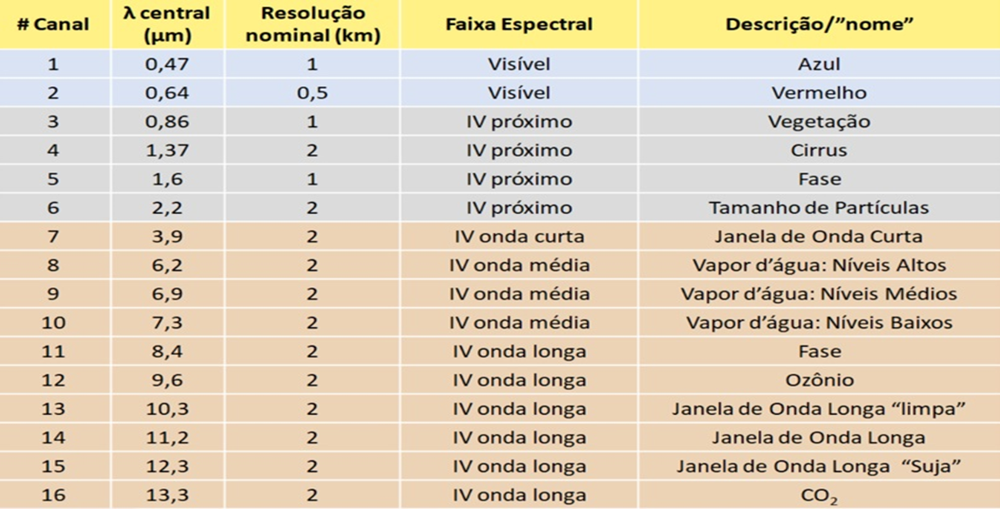

# **Importando as Bibliotecas Python Necessárias**

Neste passo vamos importar todas as bibliotecas necessárias para esta demonstração: **"netCDF4"** para abrir arquivos e ler valores de pixels, **"matplotlib"** para gerar imagens, **"datetime"** para ler a data e hora de aquisição, **"cartopy"** para adicionar mapas e **"numpy"** para realizar cálculos diversos.

In [ ]:
# required modules
from netCDF4 import Dataset         # read / write NetCDF4 files
import matplotlib.pyplot as plt     # plotting library
from datetime import datetime       # basic dates and time types
import cartopy, cartopy.crs as ccrs # plot maps
import numpy as np                  # scientific computing with Python

# **Abrindo um Arquivo GOES-16 com a Biblioteca NetCDF4 e Verificando os "Datasets" Disponíveis**

Primeiro, vamos criar um objeto chamado **"file"** (você pode chamá-lo como quiser) e abrir uma imagem GOES-16 com o comando **"Dataset"** da biblioteca NetCDF4:

In [ ]:
# open the GOES-R NetCDF file
file = Dataset("samples/OR_ABI-L2-CMIPF-M6C13_G16_s20232411500206_e20232411509526_c20232411509585.nc")

Como veremos, temos vários datasets dentro de um arquivo NetCDF (com informações muito úteis!). Com o comando **"variables.keys()"**, podemos listar todos os datasets disponíveis.

In [ ]:
# listing the key NetCDF variables
file.variables.keys()

dict_keys(['CMI', 'DQF', 't', 'y', 'x', 'time_bounds', 'goes_imager_projection', 'y_image', 'y_image_bounds', 'x_image', 'x_image_bounds', 'nominal_satellite_subpoint_lat', 'nominal_satellite_subpoint_lon', 'nominal_satellite_height', 'geospatial_lat_lon_extent', 'band_wavelength', 'band_id', 'total_number_of_points', 'valid_pixel_count', 'outlier_pixel_count', 'min_brightness_temperature', 'max_brightness_temperature', 'mean_brightness_temperature', 'std_dev_brightness_temperature', 'planck_fk1', 'planck_fk2', 'planck_bc1', 'planck_bc2', 'algorithm_dynamic_input_data_container', 'percent_uncorrectable_GRB_errors', 'percent_uncorrectable_L0_errors', 'earth_sun_distance_anomaly_in_AU', 'processing_parm_version_container', 'algorithm_product_version_container', 'esun', 'kappa0', 'focal_plane_temperature_threshold_exceeded_count', 'maximum_focal_plane_temperature', 'focal_plane_temperature_threshold_increasing', 'focal_plane_temperature_threshold_decreasing', 'channel_integration_time', '

Vamos verificar as características do dataset **"CMI"** (ou "Cloud and Moisture Imagery", como foi atribuído pela NOAA). De acordo com a documentação do produto, através deste dataset podemos let o **"fator de refletância / reflectance factor"** (nas bandas visíveis) e as **"temperaturas de brilho / brightness temperatures"** para os canais infravermelhos:

https://www.goes-r.gov/products/baseline-cloud-moisture-imagery.html

In [ ]:
# reading a specific variable
file.variables['CMI']

<class 'netCDF4.Variable'>
int16 CMI(y, x)
    _FillValue: -1
    long_name: ABI L2+ Cloud and Moisture Imagery brightness temperature
    standard_name: toa_brightness_temperature
    _Unsigned: true
    sensor_band_bit_depth: 12
    valid_range: [   0 4095]
    scale_factor: 0.06145332
    add_offset: 89.62
    units: K
    resolution: y: 0.000056 rad x: 0.000056 rad
    coordinates: band_id band_wavelength t y x
    grid_mapping: goes_imager_projection
    cell_methods: t: point area: point
    ancillary_variables: DQF
unlimited dimensions: 
current shape = (5424, 5424)
filling on

Note que para esse canal em particular (Banda 13 - 10.3 µm - 2 km - Full Disk) temos **5424 linhas x 5424 colunas**. Para bandas de 1 km Full Disk teríamos o dobro, e para a banda de 0.5 km Full Disk teríamos 4 vezes mais (um plot da banda de 0.5 km requer um bom poder computacional). Veja também que a unidade de pixel para este canal em particular é Kelvin.

Considerando isso, vamos ler nosso dataset CMI e criar um plot preliminar.

# **Lendo e Plotando o Dataset CMI (Cloud and Moisture Imagery)**

Primeiro, vamos ler os valores de pixels do dataset CMI, converter os pixels para °C e armazenar todos os valores dessa matriz 2D (5424 x 5424) na variável **"data"** (novamente, você pode chamá-la do que quiser). Vamos usar essa variável para plotar uma imagem, mas lembre-se, você tem todas as temperaturas de brilho em uma matriz 2d, portanto para utilizá-la para realizar qualquer operação (cálculos, criar gráficos, etc).

In [ ]:
# get the pixel values
data = file.variables['CMI'][:] - 273.15

Agora vamos definir o tamanho da imagem (em polegadas) e plotar a variável **"data"** em uma escala de cinza chamada **"Greys"** (branco para valores baixos de temperatura de brilho (BT) e preto para valores altos de temperatura de brilho) usando o comando "imshow" da matplotlib.

Vamos passar algums parâmetros para o comando **"imshow"**:
- **"data"**: a variável que desejamos plotar.

- **"vmin"** e **"vmax"**: os valores mínimos e máximos da paleta de cores (ou "colormap"). Você pode ajustar estes valores de acordo com a sua preferência.

- **"cmap"**: a paleta de cores a ser utilizada. Acesse o seguinte link para verificar as paletas de cores padrão da matplotlib: https://matplotlib.org/stable/tutorials/colors/colormaps.html

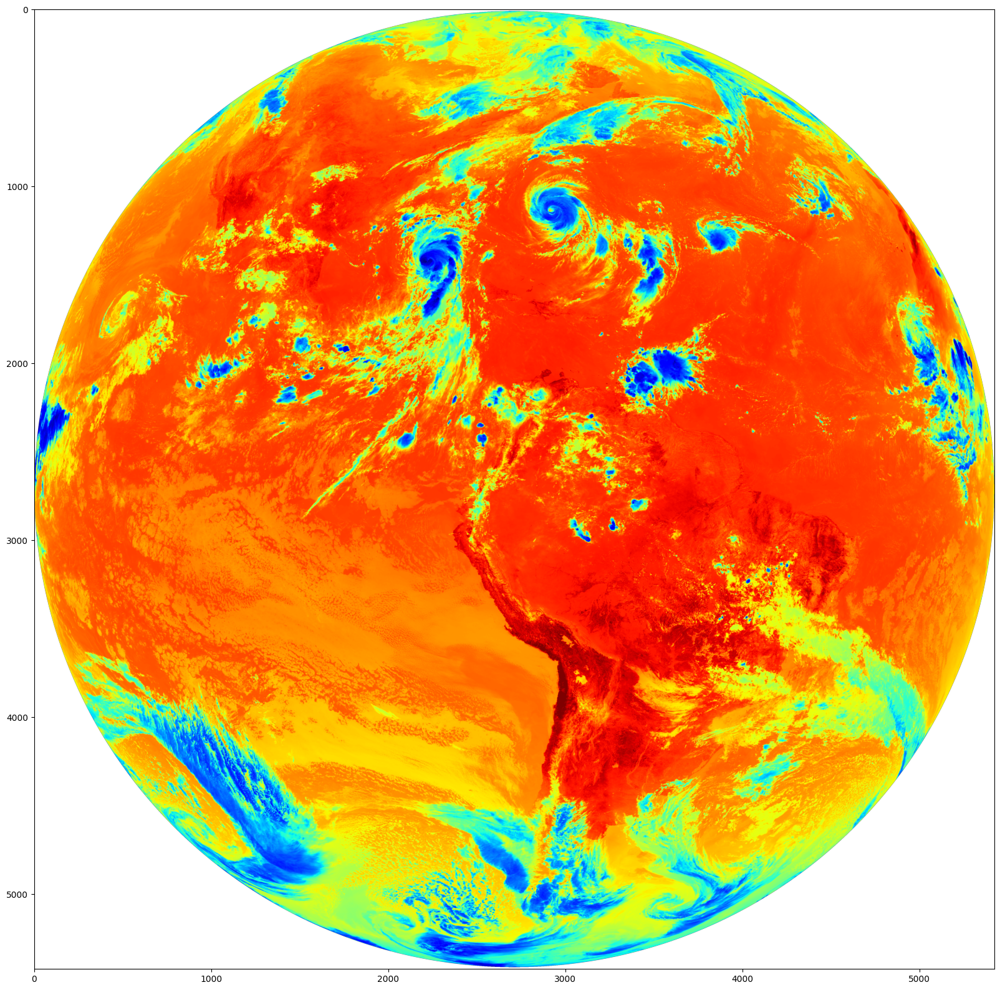

In [ ]:
# choose the plot size (width x height, in inches)
plt.figure(figsize=(20,20))

# plot the image
plt.imshow(data, vmin=-80, vmax=40, cmap='jet')

# **Lendo da Data e Hora da Aquisição, Adicionando um Título e uma "Colorbar"**

Vamos adicionar algumas decorações ao nosso plot. Desejamos adicionar um título com a data e hora de aquisição do sensor (início de um scan full disk de 10 minutos).

Primeiro, vamos verificar o formato desta informação de data e hora disponível nos metadados do arquivo NetCDF (atributo global **"time_coverage_start"**):

In [ ]:
file.getncattr('time_coverage_start')

'2023-08-29T15:00:20.6Z'

Para criar um objeto **"datetime" object**, precisamos informar como esta informação é formatada. Como vemos acima, para os dados GOES-R temos 4 digitos para o ano ("2023"), um traço "-", dois dígitos para o mês ("09"), um traço "-", dois dígitos para o dia ("07"), um  "T" maiúsculo, dois dígitos para a hora ("15"), dois pontos ":", dois dígitos para os minutos ("00"), dois pontos ":", dois dígitos para os segundos ("20"), um ponto ".", um dígito para os milisegundos ("6") e um "Z" maiúsculo.

De acordo com os **códigos de formatação** da biblioteca **"datetime"**  (https://docs.python.org/3/library/datetime.html#strftime-and-strptime-format-codes), um **"%Y"** significa 4 dígitos para o ano, **"%m"** significa 2 dígitos para o mês, **"%d"** significa dois dígitos para os dias, **"%H"** significa dois dígitos para horas, **"%M"** significa dois dígitos para os minutos, **"%S"** significa dois dígitos para os segundos e **"%f"** para os milisegundos.

Vamos criar um objeto datetime, lendo a data/hora do aquivo NetCDF e informando como está formatado.

In [ ]:
# read the time/date from the NetCDF file metadata as a string
date_string = file.getncattr('time_coverage_start')

# how this time/date is formatted (using the timedate convention)
date_format = '%Y-%m-%dT%H:%M:%S.%fZ'

# create the datetime object
date_obj = datetime.strptime(date_string, date_format)
print(date_obj)

2023-08-29 15:00:20.600000


Agora que temos um objeto datetime, podemos criar nossa própria **string customizada**, formatada como queremos, usando as mesmas diretivas da convenção da biblioteca datetime encontradas no mesmo link (https://docs.python.org/3/library/datetime.html#strftime-and-strptime-format-codes). No exemplo abaixo vamos criar uma string com os valores de **ano, mês, dia, hora, minutos, seguidos por "UTC"**:

In [ ]:
date = date_obj.strftime('%Y-%m-%d %H:%M UTC')
print(date)

2023-08-29 15:00 UTC


Mas podemos criar uma string usando **qualquer convenção datetime que desejar**, como no exemplo abaixo (onde o dia da semana foi adicionado com a diretiva **"%A"** da datetime e o nome do mês com a diretiva datetime **"%B"**):

In [ ]:
date_obj.strftime('%A - %B %d %Y - %H:%M UTC')

'Tuesday - August 29 2023 - 15:00 UTC'

Agora que já conhecemos como ler e formatar a data e hora de aquisição, vamos cria rum plot adicionando a string com esta informação em um título. Também vamos adicionar uma barra de cores com o comando **"colorbar"**:

Text(1.0, 1.0, 'Curso OMM 2024')

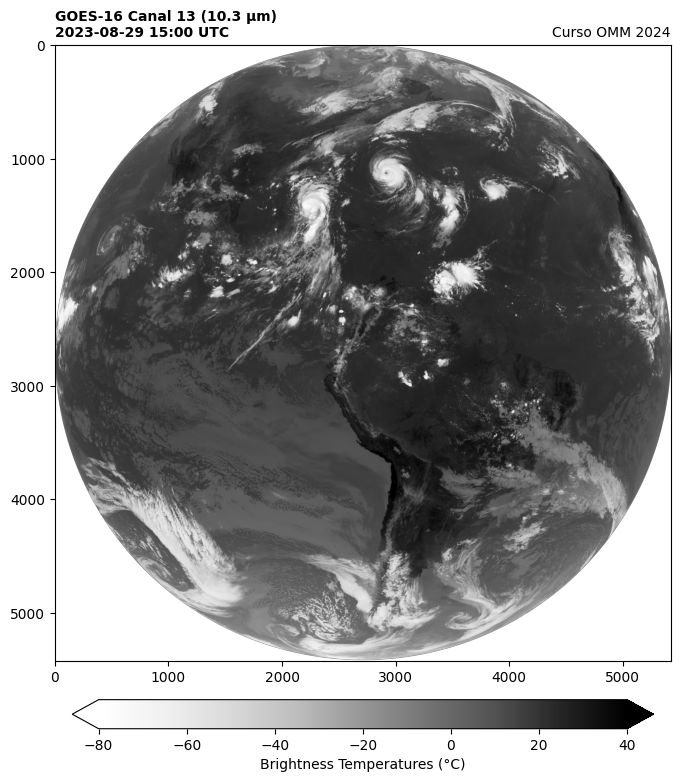

In [ ]:
# choose the plot size (width x height, in inches)
plt.figure(figsize=(10,10))

# plot the image
plt.imshow(data, vmin=-80, vmax=40, cmap='Greys')

# add a colorbar
plt.colorbar(label='Brightness Temperatures (°C)', extend='both', orientation='horizontal', pad=0.05, shrink=0.75)

# add a title (one on the left and one on the right)
plt.title(f'GOES-16 Canal 13 (10.3 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('Curso OMM 2024', fontsize=10, loc='right')

# **Adicionando Mapas com a Cartopy**

Vamos adicionar alguns mapas ao nosso plot. A primeira coisa que precisamos fazer é declarar a projeção do nosso dado. Nos usaremos a projeção "geostationary" (geoestacionária) da Cartopy. Para uma lista completa das projeções suportadas, verifique o seguinte link: https://scitools.org.uk/cartopy/docs/v0.15/crs/projections.html

Para a projeção geoestacionária, precisamos informar a **longitude central** e a **altitude do satélite**. Felizmente, podemos ler essa informação diretamente dos metadados do arquivo NetCDF4 do GOES-R.

Com isso, também podemos adicionar **limites dos países, linhas de costa, e referência de latitudes e longitures** entre outras características disponíveis na Cartopy.

/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


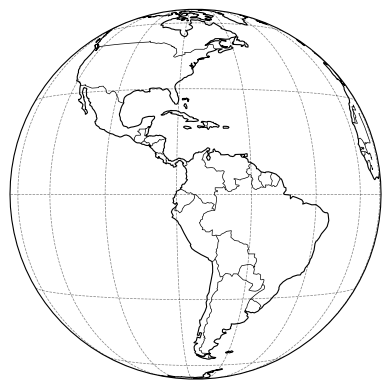

In [ ]:
# read the satellite longitude from the metadata
longitude = file.variables['goes_imager_projection'].longitude_of_projection_origin

# read the satellite altitude from the metadata
height = file.variables['goes_imager_projection'].perspective_point_height

# use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.Geostationary(central_longitude=longitude, satellite_height=height))

# add coastlines, borders and gridlines
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5)
ax.coastlines(resolution='110m', color='black', linewidth=0.8)
ax.gridlines(color='black', alpha=0.5, linestyle='--', linewidth=0.5)

Também precisamos informar a extensão **("extent")** do nosso dado. De acordo com a documentação do produto (https://www.goes-r.gov/products/docs/PUG-L2+-vol5.pdf), a extensão do dado pode ser calculada **multiplicando metade do full disk pelo tamanho do pixel em radianos e pela altitude do satélite**.

Novamente, toda esta informação está disponível nos metadados.
Calculando estes parâmetros lendo os metadados é muito útil: como vamos ver, podemos usar os mesmos scripts para plotar os setores **Full Disk, CONUS ou Mesoescala**:

In [ ]:
# calculate the extent of the GOES-R full disk in decimals (2712*0.000056*35786023.0)
xmin = file.variables['x'][:].min() * height
xmax = file.variables['x'][:].max() * height
ymin = file.variables['y'][:].min() * height
ymax = file.variables['y'][:].max() * height

# list with the extent
img_extent = (xmin, xmax, ymin, ymax)
print(img_extent)

(np.float64(-5433892.69232443), np.float64(5433892.69232443), np.float64(-5433892.69232443), np.float64(5433892.69232443))


Finalmente, podemos sobrepor mapas ao nosso plot com a biblioteca cartopy:

Text(1.0, 1.0, 'GOES-R DataJam')

/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_1_states_provinces_lakes.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


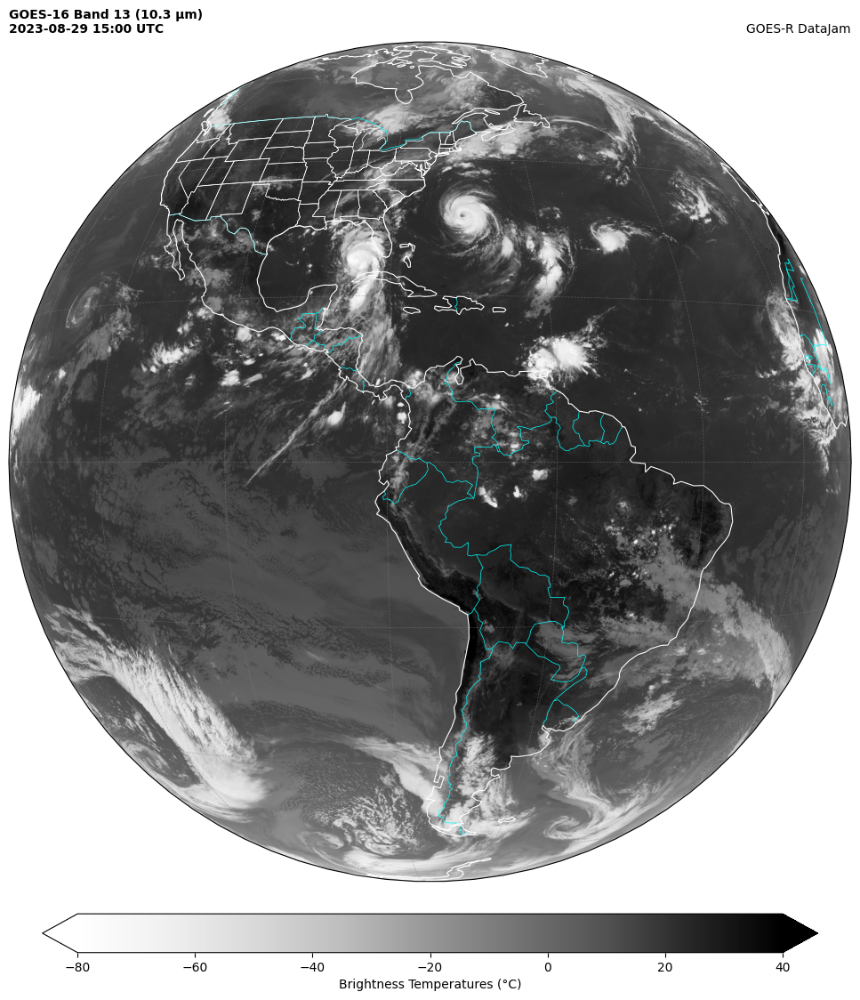

In [ ]:
# open the GOES-R NetCDF file
file = Dataset("samples/OR_ABI-L2-CMIPF-M6C13_G16_s20232411500206_e20232411509526_c20232411509585.nc")

# get the pixel values
data = file.variables['CMI'][:] - 273.15

# choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.Geostationary(central_longitude=longitude, satellite_height=height))

# calculate the extent of the GOES-R full disk in decimals (2712*0.000056*35786023.0)
xmin = file.variables['x'][:].min() * height
xmax = file.variables['x'][:].max() * height
ymin = file.variables['y'][:].min() * height
ymax = file.variables['y'][:].max() * height

# list with the extent
img_extent = (xmin, xmax, ymin, ymax)

# add coastlines, borders and gridlines
ax.add_feature(cartopy.feature.BORDERS, edgecolor='cyan', linewidth=0.5)
ax.add_feature(cartopy.feature.STATES, edgecolor='white', linewidth=0.5)
ax.coastlines(resolution='110m', color='white', linewidth=0.8)
ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5)

# plot the image
img = ax.imshow(data, vmin=-80, vmax=40, origin='upper', extent=img_extent, cmap='Greys')

# add a colorbar
plt.colorbar(img, label='Brightness Temperatures (°C)', extend='both', orientation='horizontal', pad=0.03, shrink=0.75)

# add a title (one on the left and one on the right)
plt.title(f'GOES-16 Band 13 (10.3 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('GOES-R DataJam', fontsize=10, loc='right')

# **Plotando uma imagem CONUS**

Você pode usar os mesmos comando para plotar uma imagem CONUS (disponível a cada 5 minutos). Nos estamos calculando a extensão do dado com os metadados, então todas as características (extensão da imagem, etc) serão calculadas automaticamente. Note que nós estamos plotando uma imagem do canal **0.64 µm** (visível) com 500 m de resolução), portanto não converteremos para "°C" e o **vmin é 0 e o vmax é 1**. Além disso, o colormap é **"gray"**, com a cor preta para valores baixos de fator de refletância e branco para valores altos de fator de refletância:

Text(1.0, 1.0, 'GOES-R DataJam')

/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_1_states_provinces_lakes.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


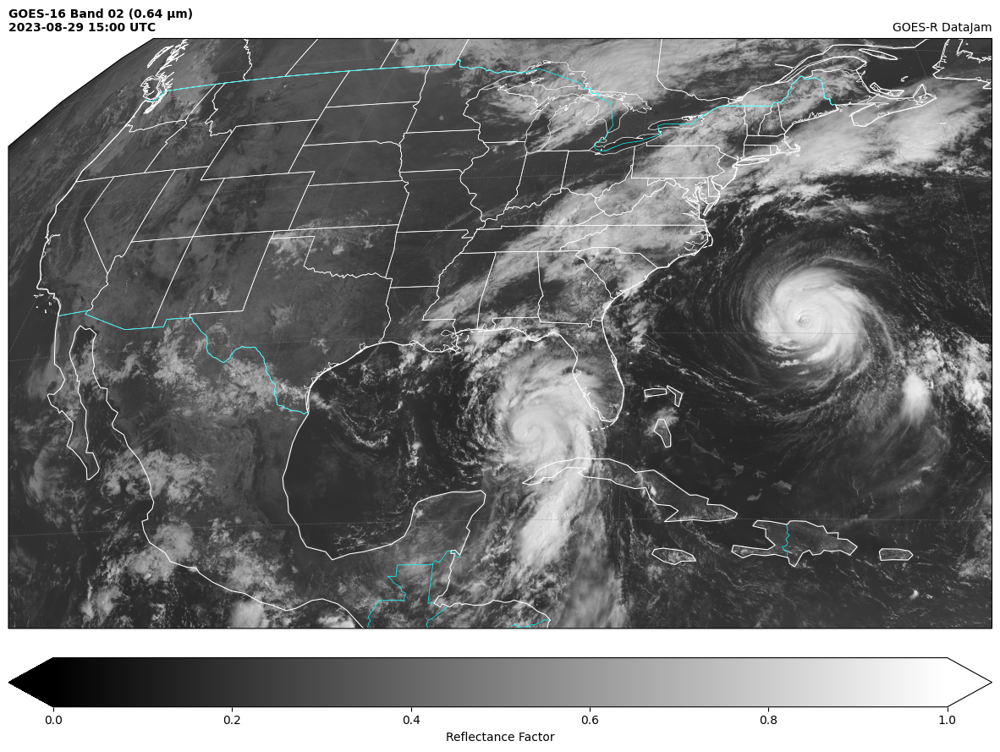

In [ ]:
# open the GOES-R NetCDF file
file = Dataset("samples/OR_ABI-L2-CMIPC-M6C02_G16_s20232411501172_e20232411503545_c20232411504026.nc")

# get the pixel values
data = file.variables['CMI'][:]

# apply the square root visible enhancement (optional)
data = np.sqrt(data)

# choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# read the satellite longitude from the metadata
longitude = file.variables['goes_imager_projection'].longitude_of_projection_origin

# read the satellite altitude from the metadata
height = file.variables['goes_imager_projection'].perspective_point_height

# use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.Geostationary(central_longitude=longitude, satellite_height=height))

# calculate the extent of the GOES-R full disk in decimals (2712*0.000056*35786023.0)
xmin = file.variables['x'][:].min() * height
xmax = file.variables['x'][:].max() * height
ymin = file.variables['y'][:].min() * height
ymax = file.variables['y'][:].max() * height

# list with the extent
img_extent = (xmin, xmax, ymin, ymax)

# add coastlines, borders and gridlines
ax.add_feature(cartopy.feature.STATES, edgecolor='white', linewidth=0.5)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='cyan', linewidth=0.5)
ax.coastlines(resolution='110m', color='white', linewidth=0.8)
ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5)

# plot the image
img = ax.imshow(data, vmin=0, vmax=1, origin='upper', extent=img_extent, cmap='gray')

# add a colorbar
plt.colorbar(img, label='Reflectance Factor', extend='both', orientation='horizontal', pad=0.03)

# add a title (one on the left and one on the right)
plt.title(f'GOES-16 Band 02 (0.64 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('GOES-R DataJam', fontsize=10, loc='right')

# **Plotando uma Imagem MESOESCALA**

Você também pode usar os mesmos comandos para plotar uma imagem MESOESCALA, um setor de 1000x1000 km disponível cada minuto (no exemplo abaixo estamos plotando o setor MESOESCALA número 1, que neste caso - furacão Idalia - estava disponível cada 30 segundos!).


Text(1.0, 1.0, 'GOES-R DataJam')

/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_1_states_provinces_lakes.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


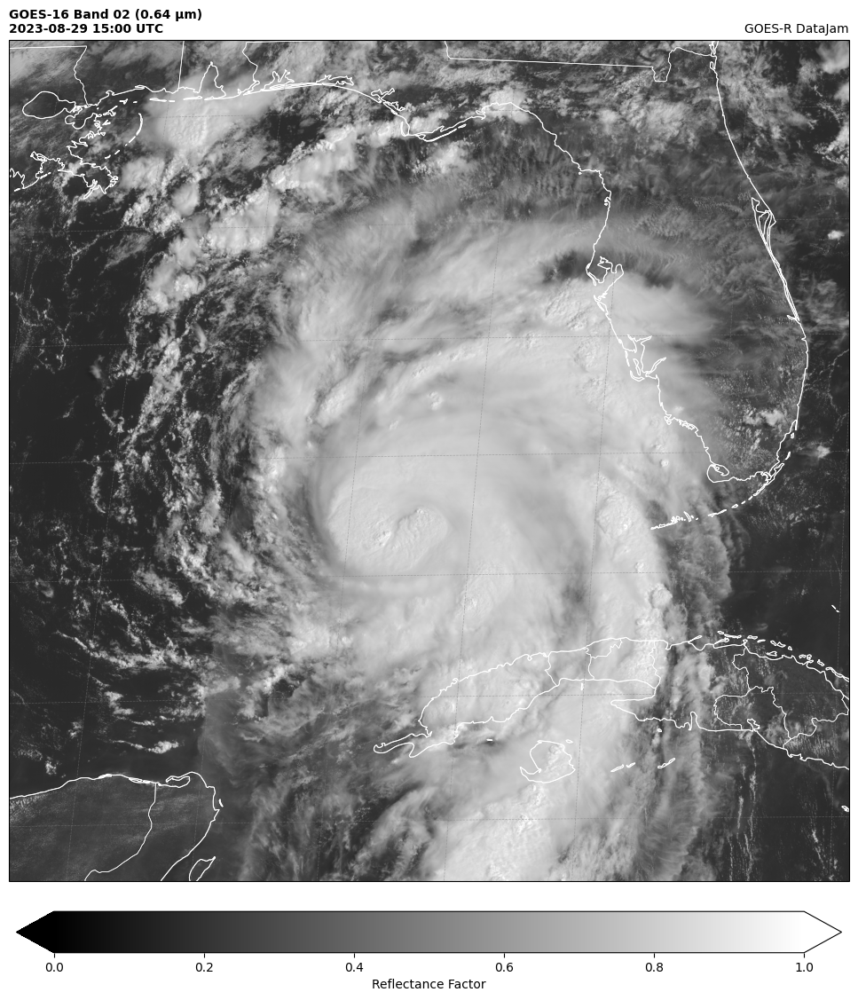

In [ ]:
# open the GOES-R NetCDF file
file = Dataset("samples/OR_ABI-L2-CMIPM1-M6C02_G16_s20232411500279_e20232411500336_c20232411500395.nc")

# get the pixel values
data = file.variables['CMI'][:]

# apply the square root visible enhancement (optional)
data = np.sqrt(data)

# choose the plot size (width x height, in inches)
plt.figure(figsize=(15,15))

# read the satellite longitude from the metadata
longitude = file.variables['goes_imager_projection'].longitude_of_projection_origin

# read the satellite altitude from the metadata
height = file.variables['goes_imager_projection'].perspective_point_height

# use the Geostationary projection in cartopy
ax = plt.axes(projection=ccrs.Geostationary(central_longitude=longitude, satellite_height=height))

# calculate the extent of the GOES-R full disk in decimals (2712*0.000056*35786023.0)
xmin = file.variables['x'][:].min() * height
xmax = file.variables['x'][:].max() * height
ymin = file.variables['y'][:].min() * height
ymax = file.variables['y'][:].max() * height

# list with the extent
img_extent = (xmin, xmax, ymin, ymax)

# add coastlines, borders and gridlines
ax.add_feature(cartopy.feature.STATES, edgecolor='white', linewidth=0.5)
ax.add_feature(cartopy.feature.BORDERS, edgecolor='cyan', linewidth=0.5)
ax.coastlines(resolution='10m', color='white', linewidth=0.8)
ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5)

# plot the image
img = ax.imshow(data, vmin=0, vmax=1, origin='upper', extent=img_extent, cmap='gray')

# add a colorbar
plt.colorbar(img, label='Reflectance Factor', extend='both', orientation='horizontal', pad=0.03, shrink=0.80)

# add a title (one on the left and one on the right)
plt.title(f'GOES-16 Band 02 (0.64 µm)\n{date}', fontweight='bold', fontsize=10, loc='left')
plt.title('GOES-R DataJam', fontsize=10, loc='right')

E é isso! Para uma versão longa de um notebook Colab com muito mais exemplos (leitura de shapefiles, recortar uma imagem, download de dados da nuvem usando scripts, sensor GLM, composições RGBs e muito mais), acesse o seguinte notebook:

https://colab.research.google.com/drive/1cU2unHLGlqQLmc_gE6YhlEyv52K9lYGe?usp=sharing

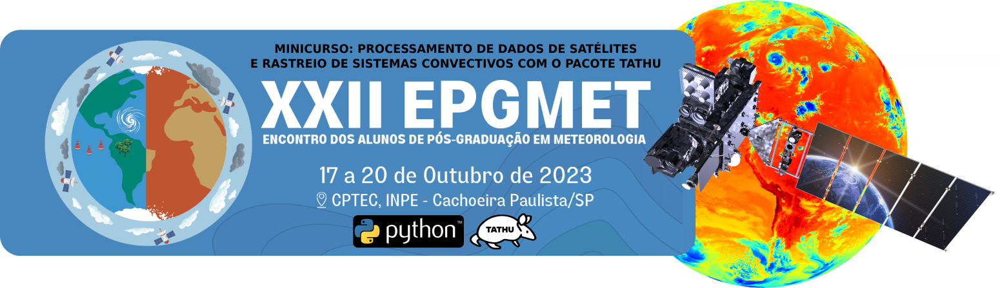

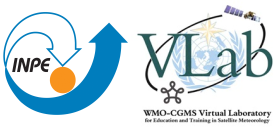

**Desenvolvido por:** Diego Souza - INPE / CGCT / DISSM (diego.souza@inpe.br / https://github.com/diegormsouza)

**Versão do Notebook COLAB:** 16 de abril de 2024